In [1]:
### HUMAN SAFETY DETECTION

In [ ]:
pip install ultralytics

In [ ]:
pip install imageio[ffmpeg]

In [ ]:
!mkdir custom_dataset
%cd custom_dataset
!curl -L "https://app.roboflow.com/ds/ZRqiPYg7Zt?key=eEtBX3wdBf" > roboflow.zip


In [ ]:
import os
os.listdir("roboflow")


image 1/1 c:\Users\AYUSH\Documents\github projects\safety detection\testimg.jpg: 640x288 7 persons, 1 backpack, 49.5ms
Speed: 8.7ms preprocess, 49.5ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 288)
Results saved to runs\detect\predict4


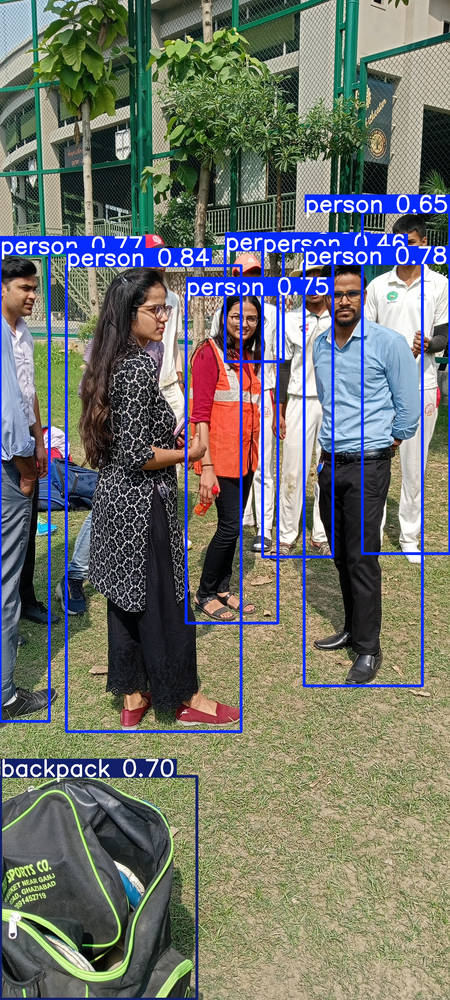

In [ ]:
from ultralytics import YOLO
from IPython.display import Image, Video , display
model = YOLO("models/yolo11n.pt") 

results = model.predict(source="testimg.jpg", save=True) 
display(Image(filename='runs/detect/predict/testimg.jpg'))

### TRAINING ON CUSTOM DATASET

In [ ]:

model = YOLO("yolo11n.pt") 

model.train(
    data="custom_dataset\custom_data.yaml",
    epochs=20,
    imgsz=640,
    batch=16 
)

### TESTING ON TRAINED MODEL 


image 1/1 c:\Users\AYUSH\Documents\github projects\safety detection\testimg.jpg: 640x288 1 no helmet, 6 unsafes, 47.9ms
Speed: 6.2ms preprocess, 47.9ms inference, 7.4ms postprocess per image at shape (1, 3, 640, 288)
Results saved to runs\detect\predict2


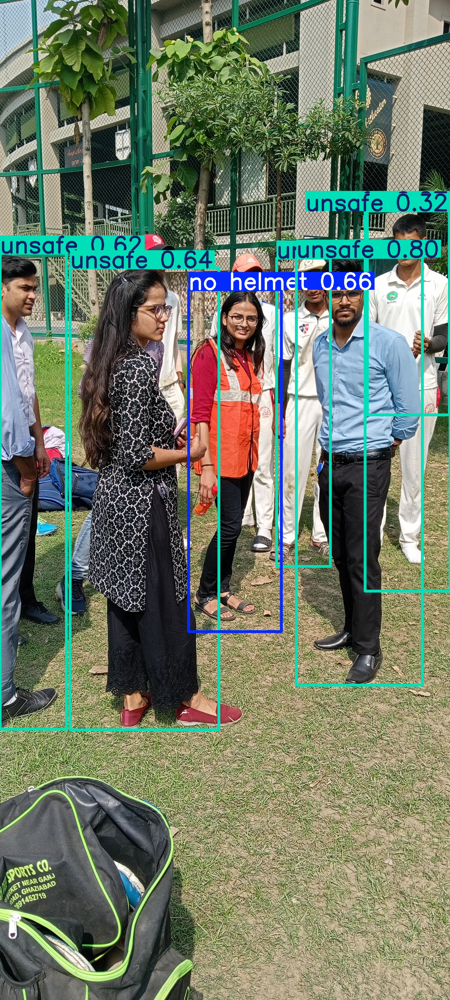

In [ ]:
model=YOLO("models/best.pt")
results=model.predict(source="testimg.jpg", save=True)
display(Image(filename='runs/detect/predict2/testimg.jpg'))

In [ ]:
model=YOLO('best.pt')
results = model.predict(source='vid.mp4' ,save=True)


In [ ]:
Video("runs/detect/predict3/vid.avi", embed=True, width=360)

### EVAL

📊 Training Results Summary:


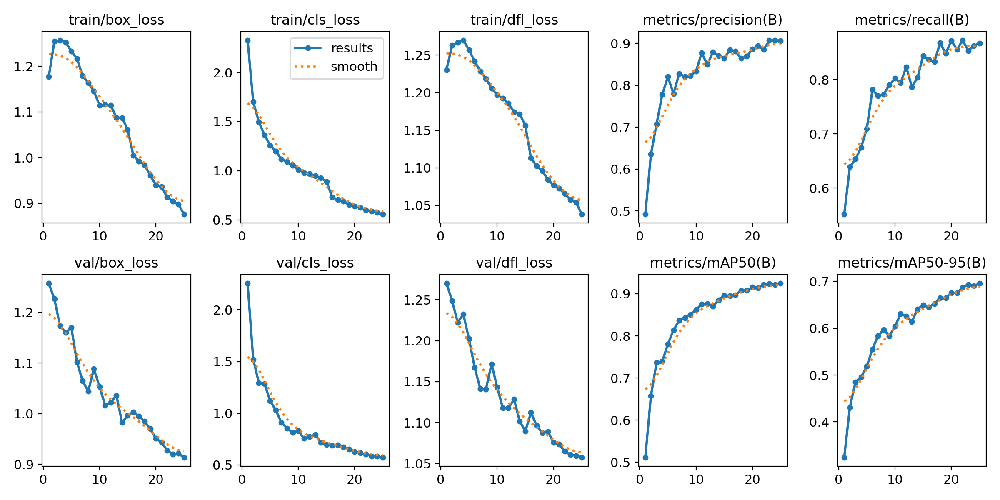

📉 Confusion Matrix:


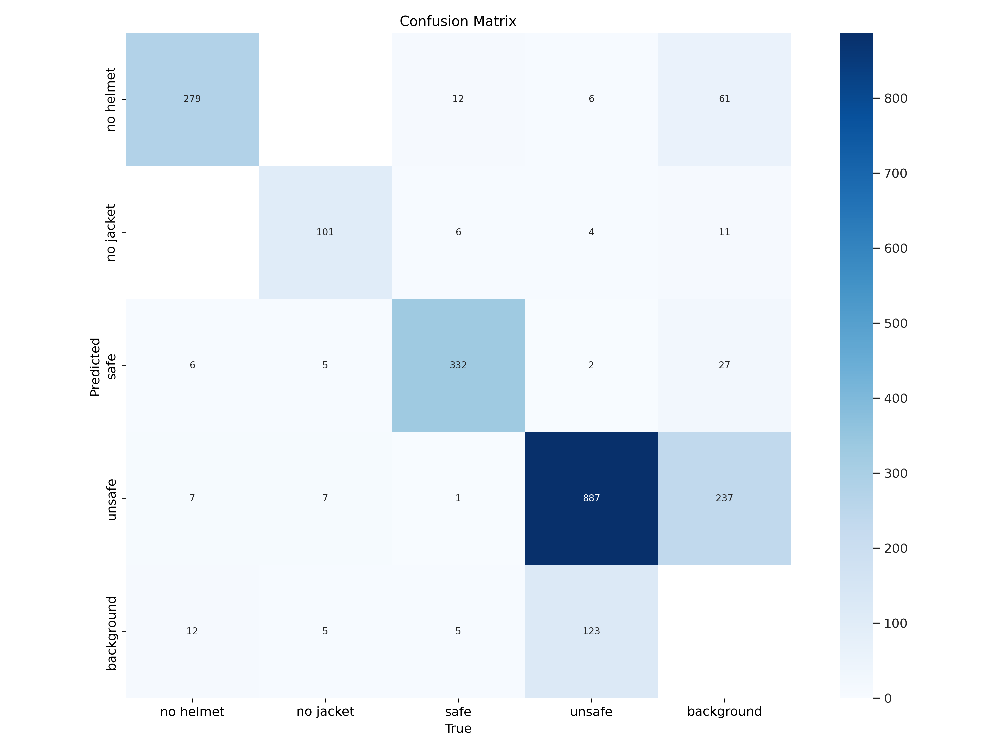

In [24]:
print("📊 Training Results Summary:")
display(Image("train/results.png"))

print("📉 Confusion Matrix:")
display(Image("train/confusion_matrix.png"))

In [31]:
import pandas as pd

df = pd.read_csv("train/results.csv")

final_epoch = df.iloc[-1]

print(f"Precision: {final_epoch['metrics/precision(B)']:.3f}")
print(f"Recall: {final_epoch['metrics/recall(B)']:.3f}")
print(f"mAP50-95(B): {final_epoch['metrics/mAP50-95(B)']:.3f}")
print(f"mAP50(B): {final_epoch['metrics/mAP50(B)']:.3f}")


Precision: 0.906
Recall: 0.867
mAP50-95(B): 0.696
mAP50(B): 0.925


In [30]:
df = pd.read_csv("train/results.csv")
print(df.columns.tolist())

['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss', 'lr/pg0', 'lr/pg1', 'lr/pg2']
